In [2]:
library(Seurat, verbose=F)
library(ggplot2, verbose=F)
library(patchwork, verbose=F)
library(magrittr, verbose=F)
library(data.table, verbose=F)
#设置当前工作目录
setwd('/Users/wjs/Desktop/github//learning_10X_spatial/')

## MIA

超几何分布：盒子里有m个白球，n个黑球，从中不放回的取出k个球，其中白球x个，这时随机变量x是服从超几何分布的。  
这是概率分布函数：  
$$
p(x) = \left. {m \choose x}{n \choose (k-x)} \right / {m+n \choose k}
$$
对应R语言中的超几何分布的概率分布函数：`dhyper(x, m, n, k, log = FALSE)`，我们进行假设检验用的是累计概率分布：`phyper(q, m, n, k, lower.tail = TRUE)`。当然，对应到我们现在应用场景，取出来的白球个数对应了空间和转录组中某个cluster或细胞类型对应marker基因的交集，因此在进行假设检验时的备择假设应该是 x大于某一个值，这里只要让参数`lower.tail=FALSE`即可满足需求。

In [3]:
sce <- readRDS('data/scData/sc_clean_newMarker.rds')

In [4]:
sce

An object of class Seurat 
31053 features across 7724 samples within 1 assay 
Active assay: RNA (31053 features, 2000 variable features)
 3 dimensional reductions calculated: pca, tsne, umap

In [5]:
anterior1 <- readRDS('data/stxBrain/withMarker_anterior1.rds')

In [6]:
backGene <- intersect(rownames(sce), rownames(anterior1))

In [7]:
backGeneNum <- length(backGene)

In [8]:
#筛选细胞类型的marker基因，按照 p_val_adj < 0.05并且avg_logFC >0.5筛选marker基因，同时只保留 cluster列和gene列
mks_sc <- data.table(sce@misc$marker)[p_val_adj<0.05 & avg_log2FC > 0.5, .(cluster, gene)]

In [9]:
setnames(mks_sc, 'cluster', 'cellType')

In [10]:
head(mks_sc)

cellType,gene
<fct>,<chr>
Ext_L25,Adam33
Ext_L25,Pdzrn3
Ext_L25,Rorb
Ext_L25,Satb2
Ext_L25,Kcnh5
Ext_L25,Cadps2


In [11]:
# 筛选marker基因，按照 p_val_adj < 0.05并且avg_logFC >0.5筛选marker基因，同时只保留 cluster列和gene列
mks_st <- data.table(anterior1@misc$marker_res0.8_all)[p_val_adj<0.05 & avg_log2FC > 0.5, list(cluster, gene)]

In [12]:
head(mks_st)

cluster,gene
<fct>,<chr>
0,Drd2
0,Lrrc10b
0,Adora2a
0,Syndig1l
0,Rgs9
0,Gpr6


In [13]:
head(mks_sc)

cellType,gene
<fct>,<chr>
Ext_L25,Adam33
Ext_L25,Pdzrn3
Ext_L25,Rorb
Ext_L25,Satb2
Ext_L25,Kcnh5
Ext_L25,Cadps2


In [14]:
# 根据基因列合并数据
inner_sc_st <- mks_st[mks_sc, on='gene', nomatch=NULL]

In [15]:
head(inner_sc_st)

cluster,gene,cellType
<fct>,<chr>,<fct>
10,Myo16,Ext_L25
0,Cacna2d3,Ext_L25
11,Ptprd,Ext_L25
2,Mef2c,Ext_L25
8,Fam19a2,Ext_L25
2,Atp1a1,Ext_L25


In [16]:
# 通过cluster和cellType列分组计算基因个数，实际效果就是任何一个cluster和任何一个cellType之间重合的marker基因个数
inner_sc_st <- inner_sc_st[, .(geneNum=.N), by=.(cluster, cellType)]

In [17]:
head(inner_sc_st)

cluster,cellType,geneNum
<fct>,<fct>,<int>
10,Ext_L25,1
0,Ext_L25,2
11,Ext_L25,1
2,Ext_L25,3
8,Ext_L25,1
7,Ext_L25,1


In [18]:
# 计算每种细胞类型的marker基因个数
mks_sc = mks_sc[, .(markerNum_sc=.N), by=cellType]

In [19]:
head(mks_sc)

cellType,markerNum_sc
<fct>,<int>
Ext_L25,55
Ext_L56,85
Ext_Thal_1,352
Ext_L5_1,171
Ext_Thal_2,193
Ext_L23,163


In [20]:
# 计算每个cluster的marker基因个数
mks_st = mks_st[, .(markerNum_st=.N), by=cluster]

In [21]:
head(mks_st)

cluster,markerNum_st
<fct>,<int>
0,61
1,12
2,18
3,86
4,63
5,14


In [22]:
#合并数据，给每一行加上marker基因个数，markerNum_sc是细胞类型的marker基因个数，markerNum_st是marker基因个数
inner_sc_st = inner_sc_st[mks_sc, on='cellType'][mks_st, on='cluster']

In [24]:
backGeneNum

[1] 17668

In [23]:
head(inner_sc_st)

cluster,cellType,geneNum,markerNum_sc,markerNum_st
<fct>,<fct>,<int>,<int>,<int>
0,Ext_L25,2,55,61
0,Ext_L56,3,85,61
0,Ext_Thal_1,6,352,61
0,Ext_L5_1,4,171,61
0,Ext_Thal_2,3,193,61
0,Ext_L23,5,163,61


In [23]:
# inner_sc_st加了pval列，pval的值是通超几何分布检验得到的p值
inner_sc_st[, pval:=phyper(geneNum, markerNum_sc, backGeneNum, markerNum_st, lower.tail = F)]

In [24]:
head(inner_sc_st)

cluster,cellType,geneNum,markerNum_sc,markerNum_st,pval
<fct>,<fct>,<int>,<int>,<int>,<dbl>
0,Ext_L25,2,55,61,0.0008960672
0,Ext_L56,3,85,61,0.0002074592
0,Ext_Thal_1,6,352,61,0.0001802438
0,Ext_L5_1,4,171,61,0.0002942902
0,Ext_Thal_2,3,193,61,0.0042670858
0,Ext_L23,5,163,61,0.0000195007


In [25]:
# 对pval列做了log转换，转换为分数
inner_sc_st$score <- -log10(inner_sc_st$pval)

In [26]:
head(inner_sc_st)

cluster,cellType,geneNum,markerNum_sc,markerNum_st,pval,score
<fct>,<fct>,<int>,<int>,<int>,<dbl>,<dbl>
0,Ext_L25,2,55,61,0.0008960672,3.047659
0,Ext_L56,3,85,61,0.0002074592,3.683067
0,Ext_Thal_1,6,352,61,0.0001802438,3.744140
0,Ext_L5_1,4,171,61,0.0002942902,3.531224
0,Ext_Thal_2,3,193,61,0.0042670858,2.369869
0,Ext_L23,5,163,61,0.0000195007,4.709950


In [27]:
scoreMat <- dcast(inner_sc_st, cluster~cellType, value.var = 'score', fill=0.)

In [28]:
head(scoreMat)

cluster,Ext_L25,Ext_L56,Ext_Thal_1,Ext_L5_1,Ext_Thal_2,Ext_L23,Oligo_2,Inh_1,Ext_Hpc_DG2,⋯,Ext_ClauPyr,Nb_2,Ext_Med,Astro_HPC,Ext_Hpc_CA2,Astro_WM,Inh_5,Astro_THAL_hab,Ext_Amy_1,Endo
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,3.047659,3.683067,3.7441397,3.531224,2.369869,4.709950,0.00000,0,2.292869,⋯,2.639917,0,2.410983,0.000000,7.3514611,0.000000,1.207609,0.000000,0,0.000000
1,0.000000,0.000000,0.0000000,2.247153,0.000000,0.000000,0.00000,0,0.000000,⋯,0.000000,0,0.000000,0.000000,4.0988371,0.000000,2.559404,0.000000,0,0.000000
2,6.609257,0.000000,0.0000000,7.921190,0.000000,9.863074,0.00000,0,0.000000,⋯,4.740075,0,0.000000,0.000000,1.2761829,0.000000,0.000000,0.000000,0,0.000000
3,0.000000,0.000000,0.0000000,0.000000,0.000000,0.000000,23.78952,0,0.000000,⋯,0.000000,0,0.000000,0.000000,0.2704858,0.000000,0.000000,0.000000,0,1.438349
4,0.000000,0.000000,0.4567254,0.000000,0.000000,0.000000,0.00000,0,0.000000,⋯,1.706733,0,0.000000,5.618431,0.0000000,4.816525,0.000000,6.365681,0,1.688373
5,3.075642,0.000000,0.0000000,2.113115,0.000000,2.152927,0.00000,0,0.000000,⋯,0.000000,0,0.000000,3.695208,1.4782915,0.000000,0.000000,4.053616,0,0.000000


In [29]:
clusterNames <- rownames(scoreMat)

In [30]:
scoreMat <- as.matrix(scoreMat[, -1])

In [31]:
rownames(scoreMat) <- clusterNames

In [32]:
head(scoreMat)

,Ext_L25,Ext_L56,Ext_Thal_1,Ext_L5_1,Ext_Thal_2,Ext_L23,Oligo_2,Inh_1,Ext_Hpc_DG2,Inh_Sst,⋯,Ext_ClauPyr,Nb_2,Ext_Med,Astro_HPC,Ext_Hpc_CA2,Astro_WM,Inh_5,Astro_THAL_hab,Ext_Amy_1,Endo
1,3.047659,3.683067,3.7441397,3.531224,2.369869,4.709950,0.00000,0,2.292869,1.470895,⋯,2.639917,0,2.410983,0.000000,7.3514611,0.000000,1.207609,0.000000,0,0.000000
2,0.000000,0.000000,0.0000000,2.247153,0.000000,0.000000,0.00000,0,0.000000,0.000000,⋯,0.000000,0,0.000000,0.000000,4.0988371,0.000000,2.559404,0.000000,0,0.000000
3,6.609257,0.000000,0.0000000,7.921190,0.000000,9.863074,0.00000,0,0.000000,0.000000,⋯,4.740075,0,0.000000,0.000000,1.2761829,0.000000,0.000000,0.000000,0,0.000000
4,0.000000,0.000000,0.0000000,0.000000,0.000000,0.000000,23.78952,0,0.000000,0.000000,⋯,0.000000,0,0.000000,0.000000,0.2704858,0.000000,0.000000,0.000000,0,1.438349
5,0.000000,0.000000,0.4567254,0.000000,0.000000,0.000000,0.00000,0,0.000000,3.648463,⋯,1.706733,0,0.000000,5.618431,0.0000000,4.816525,0.000000,6.365681,0,1.688373
6,3.075642,0.000000,0.0000000,2.113115,0.000000,2.152927,0.00000,0,0.000000,0.000000,⋯,0.000000,0,0.000000,3.695208,1.4782915,0.000000,0.000000,4.053616,0,0.000000


In [33]:
suppressMessages(library(ComplexHeatmap, verbose=F))

Warning message:
“package ‘ComplexHeatmap’ was built under R version 4.2.1”


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.



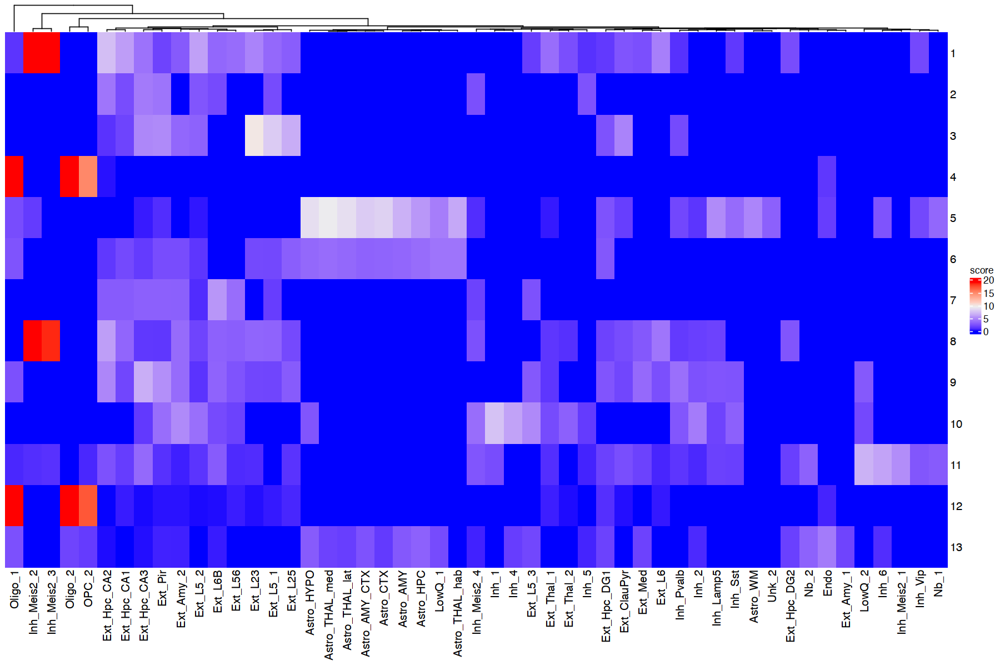

In [34]:
options(repr.plot.width=15, repr.plot.height=10)
Heatmap(scoreMat, cluster_columns = T, cluster_rows = F,
        #column_title='Score', column_title_gp = gpar(fontsize = 20),
        heatmap_legend_param = list(title = 'score', title_position='topleft'),
        row_names_side='right',)

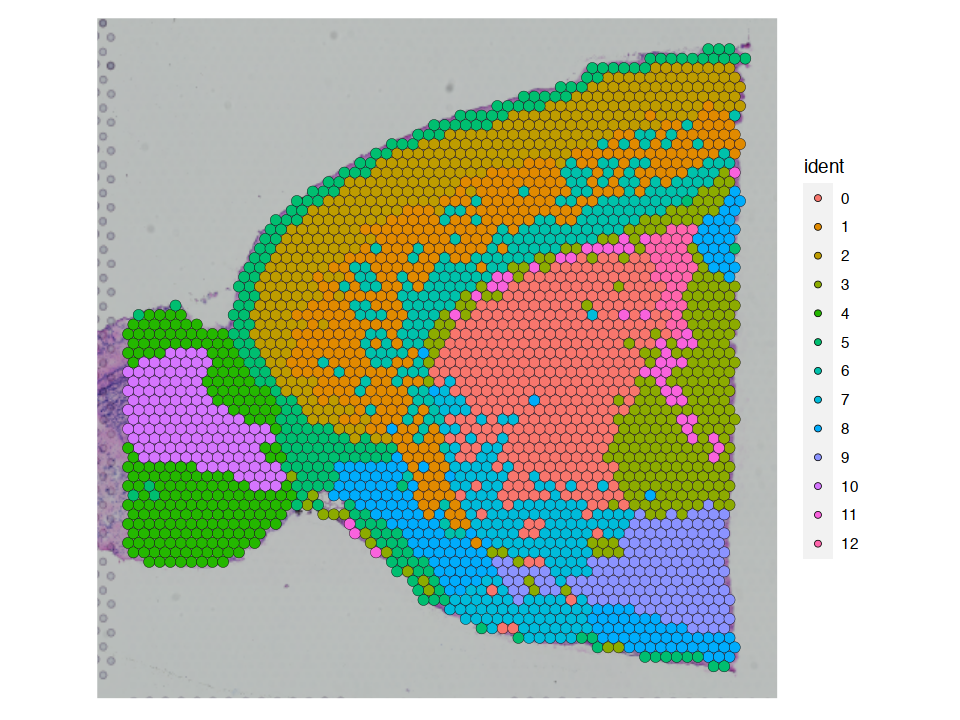

In [35]:
options(repr.plot.width=8, repr.plot.height=6)
SpatialDimPlot(anterior1, )

In [36]:
x <- inner_sc_st[cellType=='Inh_Meis2_4', .(cluster, score)]

In [37]:
head(x)

cluster,score
<fct>,<dbl>
1,2.439384
4,1.077295
6,1.879627
7,2.486940
9,3.752251
10,2.689747


In [38]:
y <- data.table(anterior1@meta.data['seurat_clusters'])

In [39]:
head(y)

seurat_clusters
<fct>
3
4
2
10
10
4


In [40]:
z <- x[y, on="cluster==seurat_clusters"]

In [41]:
anterior1@meta.data$score <- z$score

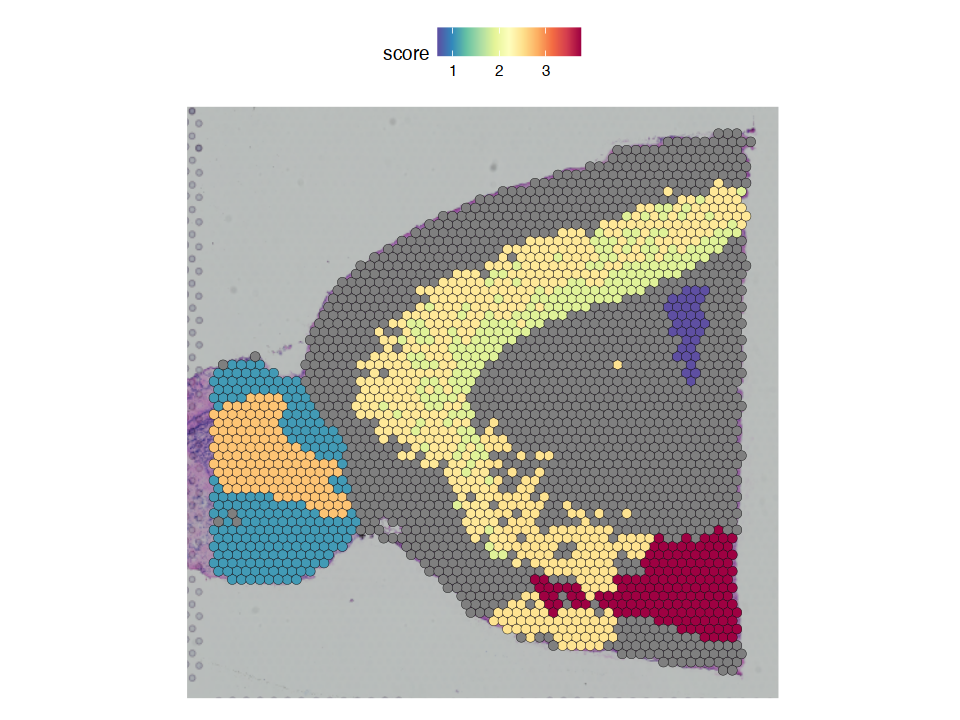

In [42]:
SpatialFeaturePlot(anterior1, features = 'score')

## SPOTlight

空间转录组学技术在保留组织背景的同时，生成基因表达谱，然而，大多数方法缺乏单细胞分辨率，并且在其捕获位点内包含多个细胞，SPOTlight 使用种子 NMF 回归来整合单细胞 RNA 测序和 ST 数据集，从单细胞数据中学习特征，并找到细胞类型的最佳加权组合来解释一个点的细胞组成。

Spotlight是一个用于空间转录组和单细胞转录组联合分析的R包，其中包括解卷积算法来估计空间基因表达量，解卷积算法是一种常见的信号处理技术，用于恢复卷积过程中隐藏的原始信号。

具体地说，Spotlight将每个位置的空间转录组测量值视为目标信号，并将单细胞转录组数据视为点扩散函数（PSF）。然后，Spotlight应用迭代盲解卷积算法来估计每个位置的基因表达量。这个算法的核心思想是在每次迭代中利用估计出来的基因表达量来更新点扩散函数，直到估计出的基因表达量收敛为止。Spotlight还使用正则化方法来避免过度拟合和增加稳定性。

非负矩阵分解（Non-negative matrix factorization, NMF）的作用是对基因表达数据进行降维和特征提取。通过将原始的高维基因表达矩阵分解为两个低维矩阵，即基因因子矩阵和位置因子矩阵，可以从数据中提取出潜在的生物学特征，如细胞类型、功能模块等。

<img src="data/figure/SPOTLight.jpg" style="width:80%;position:relative;left:10%" alt='IMG'>

In [4]:
library(SPOTlight, verbose=F)

In [5]:
sc_ref <- readRDS('data/scData/sc_clean_newMarker.rds')

In [6]:
mks <- sc_ref@misc$marker[sc_ref@misc$marker$avg_log2FC > 1., ]

In [7]:
rmgroup <- setdiff(unique(sc_ref$annotation_1), unique(mks$cluster))

In [8]:
head(sc_ref)

,orig.ident,nCount_RNA,nFeature_RNA,Cell.ID,sample,annotation_1,annotation_1_print
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>
AAACCCAAGGAAGTAG-1,s80,5578,2455,5705STDY8058280_AAACCCAAGGAAGTAG-1,5705STDY8058280,Ext_L25,23_Ext_L25
AAACCCAAGGGCAGTT-1,s80,6510,2722,5705STDY8058280_AAACCCAAGGGCAGTT-1,5705STDY8058280,Ext_L56,24_Ext_L56
AAACCCAAGGTTGTTC-1,s80,7324,2924,5705STDY8058280_AAACCCAAGGTTGTTC-1,5705STDY8058280,Ext_Thal_1,32_Ext_Thal_1
AAACCCAAGTTAACAG-1,s80,4504,2038,5705STDY8058280_AAACCCAAGTTAACAG-1,5705STDY8058280,Ext_L5_1,25_Ext_L5_1
AAACCCACAACAGATA-1,s80,11673,3995,5705STDY8058280_AAACCCACAACAGATA-1,5705STDY8058280,Ext_Thal_2,33_Ext_Thal_2
AAACCCACAGAGCCCT-1,s80,9291,3404,5705STDY8058280_AAACCCACAGAGCCCT-1,5705STDY8058280,Ext_L23,22_Ext_L23
AAACCCACATAGGTAA-1,s80,8136,3201,5705STDY8058280_AAACCCACATAGGTAA-1,5705STDY8058280,Ext_Thal_1,32_Ext_Thal_1
AAACCCAGTACGCTTA-1,s80,2613,1405,5705STDY8058280_AAACCCAGTACGCTTA-1,5705STDY8058280,Oligo_2,59_Oligo_2
AAACCCAGTAGCTTTG-1,s80,4547,2343,5705STDY8058280_AAACCCAGTAGCTTTG-1,5705STDY8058280,Inh_1,37_Inh_1


In [9]:
cells <- rownames(sc_ref@meta.data[!sc_ref$annotation_1 %in% rmgroup,])

In [10]:
sc_ref <- subset(sc_ref, cells = cells)

In [11]:
table(sc_ref$annotation_1)


 Astro_AMY_CTX      Astro_CTX     Astro_HYPO Astro_THAL_lat Astro_THAL_med 
            76            110             91             69             82 
     Ext_Amy_2    Ext_Hpc_CA1    Ext_Hpc_CA3    Ext_Hpc_DG1    Ext_Hpc_DG2 
           137            144             63             85            260 
       Ext_L23        Ext_L25       Ext_L5_1       Ext_L5_2        Ext_L56 
           391            317            210             62            309 
        Ext_L6        Ext_L6B        Ext_Pir     Ext_Thal_1     Ext_Thal_2 
           144             64            218            256            187 
         Inh_1          Inh_2          Inh_3          Inh_4          Inh_6 
           357             69            149            246            143 
     Inh_Lamp5    Inh_Meis2_1    Inh_Meis2_2    Inh_Meis2_3      Inh_Pvalb 
            57             89            124            167            186 
       Inh_Sst        Inh_Vip         LowQ_2          Micro        Oligo_1 
           

In [12]:
idx <- split(seq(ncol(sc_ref)), sc_ref$annotation_1)

In [13]:
n_cells <- 75

In [14]:
cs_keep <- lapply(idx, function(i) {
    n <- length(i)
    if (n < n_cells)
      n_cells <- n
    sample(i, n_cells)
  })

In [15]:
sc <- sc_ref[, unlist(cs_keep)]

In [16]:
sc

An object of class Seurat 
31053 features across 2698 samples within 1 assay 
Active assay: RNA (31053 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 3 dimensional reductions calculated: pca, tsne, umap

In [17]:
anterior1 <- readRDS('data/stxBrain/withMarker_anterior1.rds')

In [24]:
#set.seed(123)
res = SPOTlight(x=sc@assays$RNA@counts,
                y=anterior1@assays$Spatial@counts,
                groups = sc@active.ident,
                mgs = mks,
                gene_id = "gene",
                group_id = "cluster",
                weight_id = "avg_log2FC",
                hvg = sc_ref@assays$RNA@var.features,
                verbose=T
                )

Scaling count matrix

Seeding initial matrices

Training NMF model

Timing stopped at: 68.44 1.775 72.2



In [ ]:
#saveRDS(res, 'data/results/resultSPOTlight.rds')

In [18]:
res <- readRDS('data/results/resultSPOTlight.rds')

In [19]:
names(res)

[1] "mat"    "res_ss" "NMF"

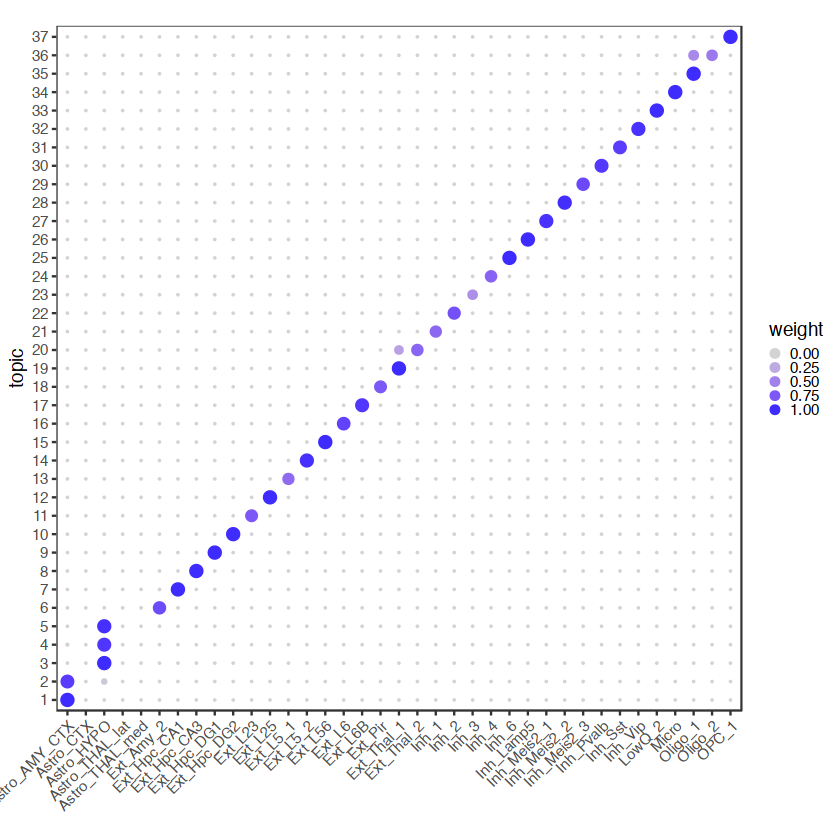

In [28]:
plotTopicProfiles(
    x = res$NMF,
    y = sc$annotation_1,
    facet = FALSE,
    min_prop = 0.01,
    ncol = 1) +
    theme(aspect.ratio = 1)

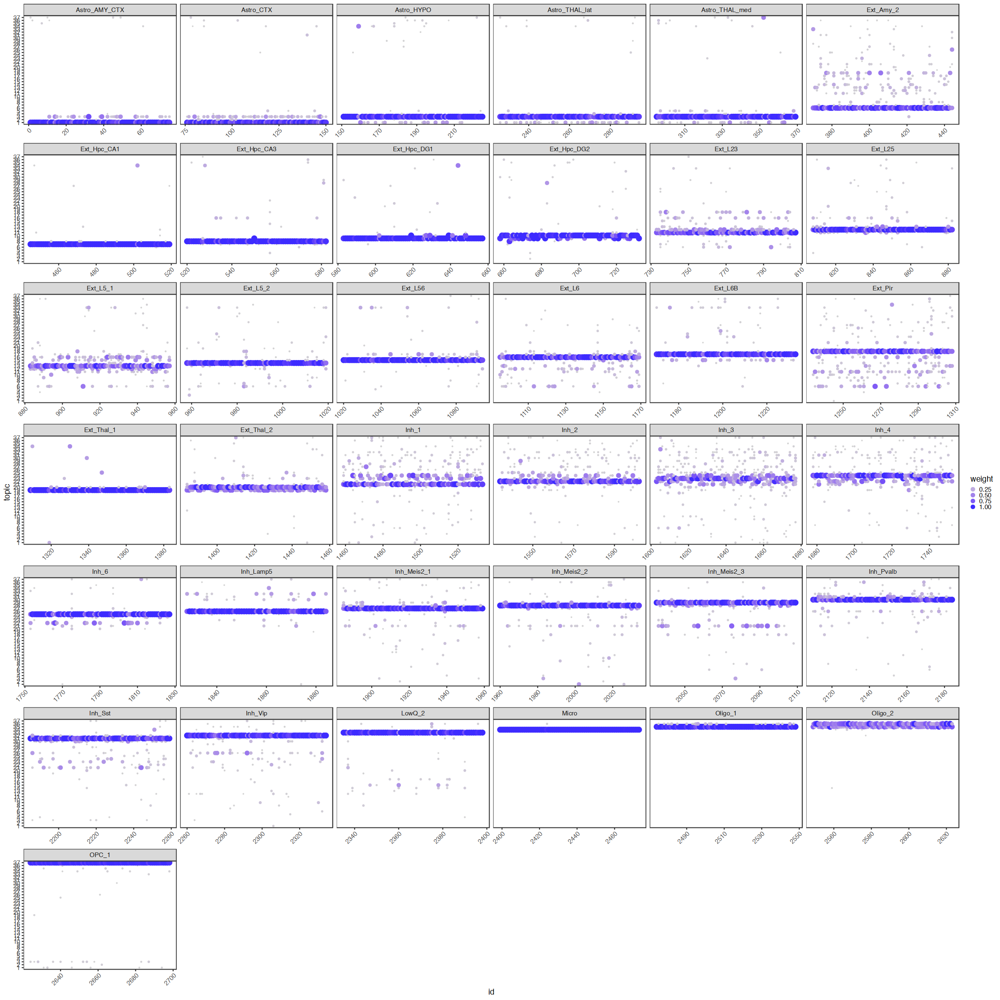

In [29]:
options(repr.plot.width=20, repr.plot.height=20)
plotTopicProfiles(
    x = res$NMF,
    y = sc$annotation_1,
    facet = TRUE,
    min_prop = 0.01,
    ncol = 6)

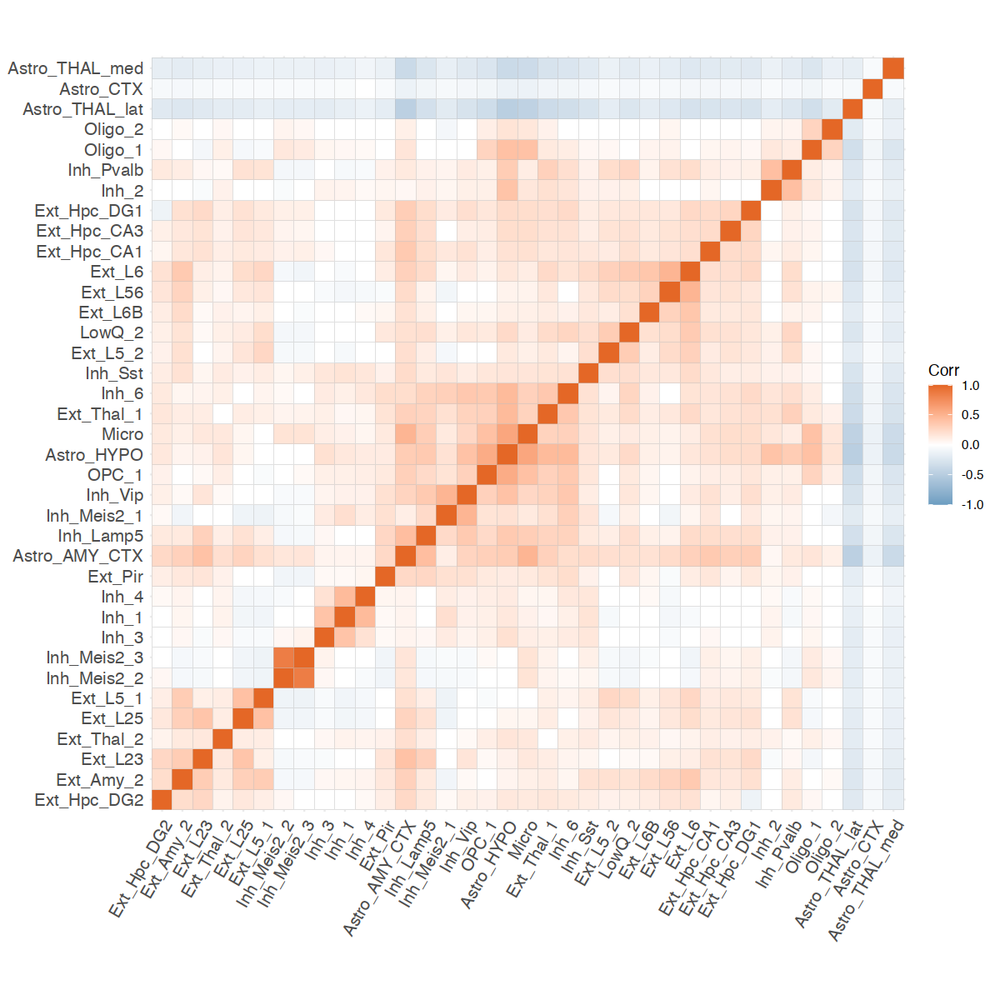

In [30]:
#help(plotCorrelationMatrix)
options(repr.plot.width=10, repr.plot.height=10)
plotCorrelationMatrix(res$mat)

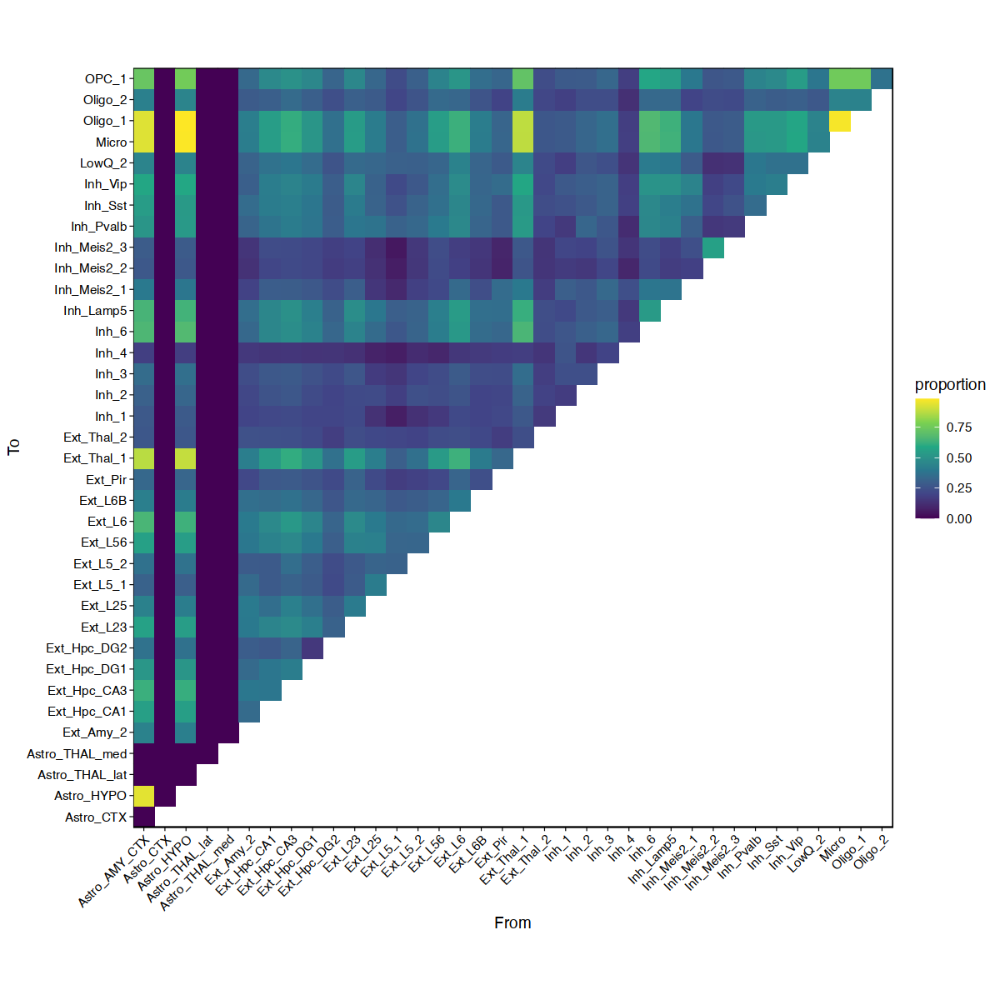

In [31]:
plotInteractions(res$mat, which = "heatmap", metric = "jaccard")

Now that we know which cell types are found within each spot we can make a graph representing spatial interactions where cell types will have stronger edges between them the more often we find them within the same spot.

In [20]:
p <- plotSpatialScatterpie(
    x = anterior1,
    y = res$mat,
    cell_types = colnames(res$mat),
    img = T,
    slice = c('anterior1'),
    scatterpie_alpha = 1,
    pie_scale = 0.4)

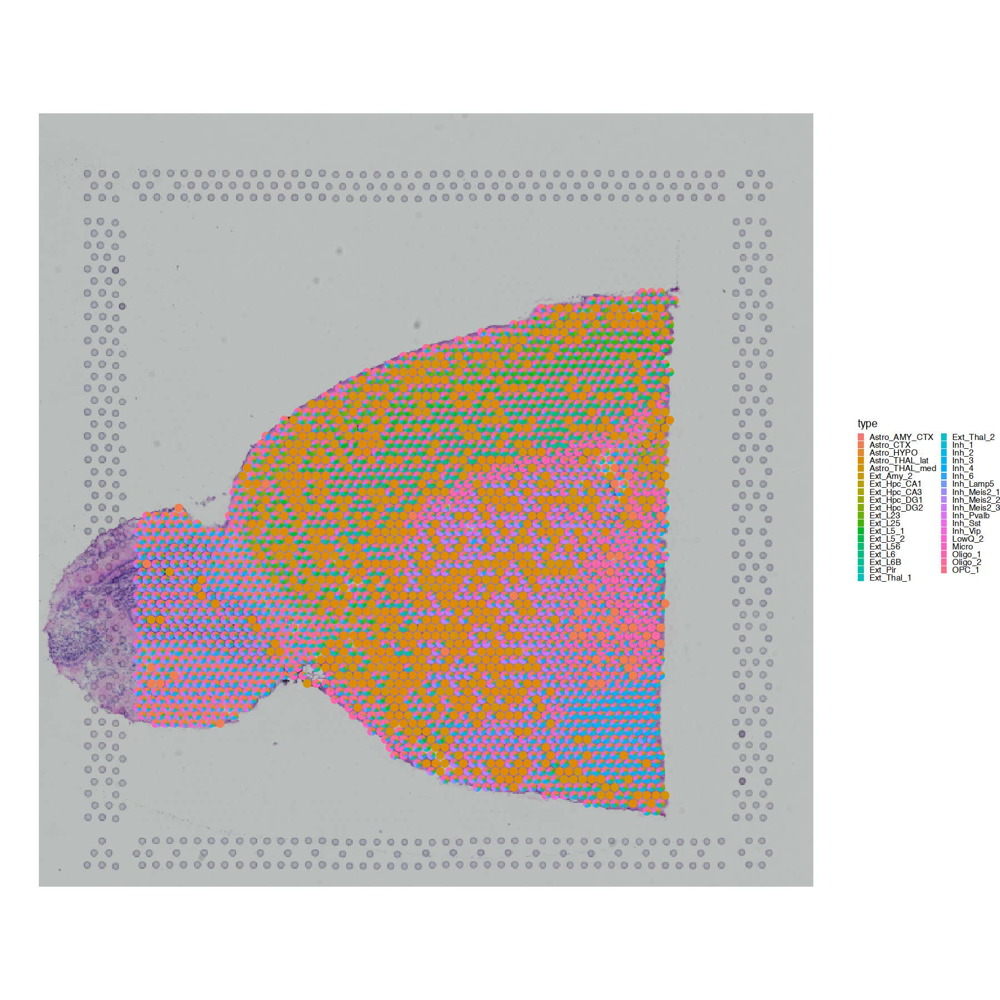

In [21]:
options(repr.plot.width=15, repr.plot.height=15)
p

In [34]:
anterior1@meta.data$cellType_spotlight <- colnames(res$mat)[apply(res$mat, 1, which.max)]

In [37]:
Idents(anterior1) <- 'cellType_spotlight'

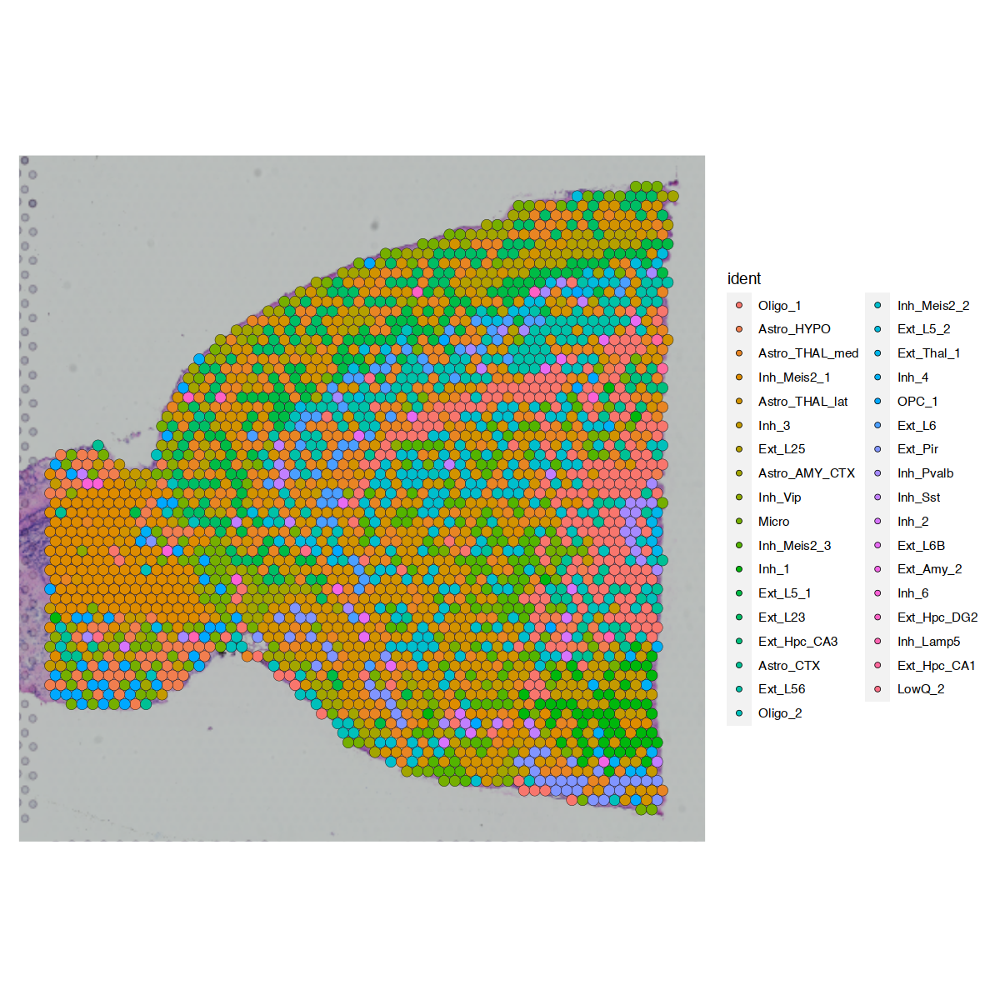

In [38]:
options(repr.plot.width=10, repr.plot.height=10)
SpatialDimPlot(anterior1)

In [39]:
unique(colnames(res$mat))

[1] "Astro_AMY_CTX"  "Astro_CTX"      "Astro_HYPO"     "Astro_THAL_lat"
 [5] "Astro_THAL_med" "Ext_Amy_2"      "Ext_Hpc_CA1"    "Ext_Hpc_CA3"   
 [9] "Ext_Hpc_DG1"    "Ext_Hpc_DG2"    "Ext_L23"        "Ext_L25"       
[13] "Ext_L5_1"       "Ext_L5_2"       "Ext_L56"        "Ext_L6"        
[17] "Ext_L6B"        "Ext_Pir"        "Ext_Thal_1"     "Ext_Thal_2"    
[21] "Inh_1"          "Inh_2"          "Inh_3"          "Inh_4"         
[25] "Inh_6"          "Inh_Lamp5"      "Inh_Meis2_1"    "Inh_Meis2_2"   
[29] "Inh_Meis2_3"    "Inh_Pvalb"      "Inh_Sst"        "Inh_Vip"       
[33] "LowQ_2"         "Micro"          "Oligo_1"        "Oligo_2"       
[37] "OPC_1"

In [91]:
head(anterior1)

,orig.ident,nCount_Spatial,nFeature_Spatial,slice,region,percent.mt,percent.ribo,nCount_SCT,nFeature_SCT,SCT_snn_res.0.8,seurat_clusters,score,cellType_spotlight,cellTypeSpot
,<fct>,<dbl>,<int>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<int>,<fct>,<fct>,<dbl>,<chr>,<dbl>
AAACAAGTATCTCCCA-1,anterior1,13069,4242,1,anterior,11.202081,5.930064,23817,4710,3,3,NA,Oligo_1,0.00000000
AAACACCAATAACTGC-1,anterior1,37448,7860,1,anterior,10.278253,5.554369,25085,7425,4,4,1.077295,Astro_HYPO,0.02273123
AAACAGAGCGACTCCT-1,anterior1,28475,6332,1,anterior,14.510975,5.576822,25455,6326,2,2,NA,Astro_THAL_med,0.00000000
AAACAGCTTTCAGAAG-1,anterior1,39718,7957,1,anterior,6.959061,7.316582,24862,7326,10,10,2.689747,Inh_Meis2_1,0.00000000
AAACAGGGTCTATATT-1,anterior1,33392,7791,1,anterior,5.282702,7.373023,25288,7673,10,10,2.689747,Astro_THAL_lat,0.00000000
AAACATGGTGAGAGGA-1,anterior1,20955,6291,1,anterior,11.052255,6.547363,23417,6288,4,4,1.077295,Astro_HYPO,0.00000000
AAACATTTCCCGGATT-1,anterior1,35538,7487,1,anterior,9.069165,6.961562,25158,7242,9,9,3.752251,Inh_3,0.01186459
AAACCGGGTAGGTACC-1,anterior1,35481,7043,1,anterior,15.430794,5.958118,25167,6804,2,2,NA,Ext_L25,0.01523936
AAACCGTTCGTCCAGG-1,anterior1,18859,4876,1,anterior,24.290790,7.232621,23531,4899,5,5,NA,Astro_AMY_CTX,0.00000000


In [42]:
options(repr.plot.width=10, repr.plot.height=10)
anterior1$cellTypeSpot <- res$mat[colnames(anterior1), 'Ext_L6B']
p1<-SpatialFeaturePlot(anterior1, features = 'cellTypeSpot')

In [43]:
anterior1$cellTypeSpot <- res$mat[colnames(anterior1), 'Ext_L23']
p2<-SpatialFeaturePlot(anterior1, features = 'cellTypeSpot')

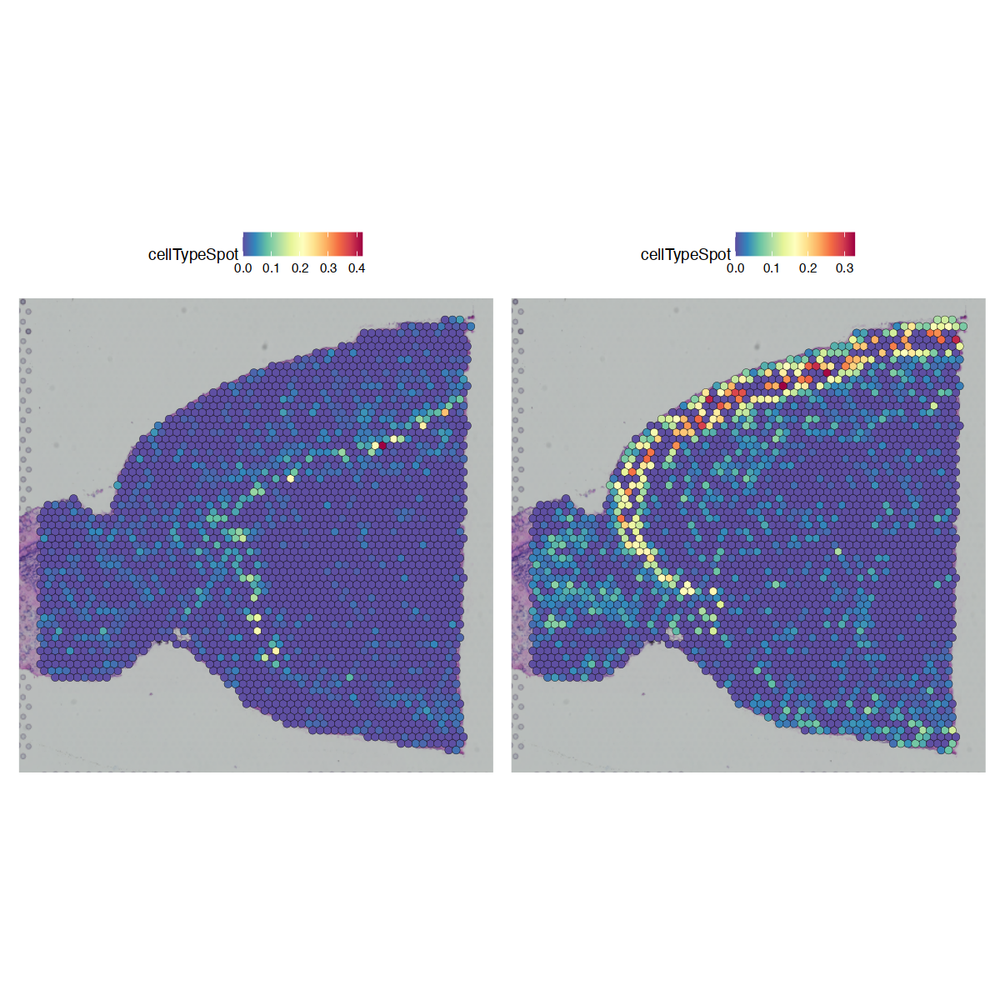

In [44]:
p1+p2

## RCTD

In [45]:
library(spacexr)
library(Matrix)
library(ggplot2)
library(Seurat)

In [47]:
anterior1 <- readRDS('data/stxBrain/raw_anterior1.rds')

In [48]:
sc_ref <- readRDS('data/scData/sc_clean_newMarker.rds')

In [49]:
SP <- SpatialRNA(coords = anterior1@images$anterior1@coordinates[, c("imagecol","imagerow")],
                 counts = anterior1@assays$Spatial@counts)

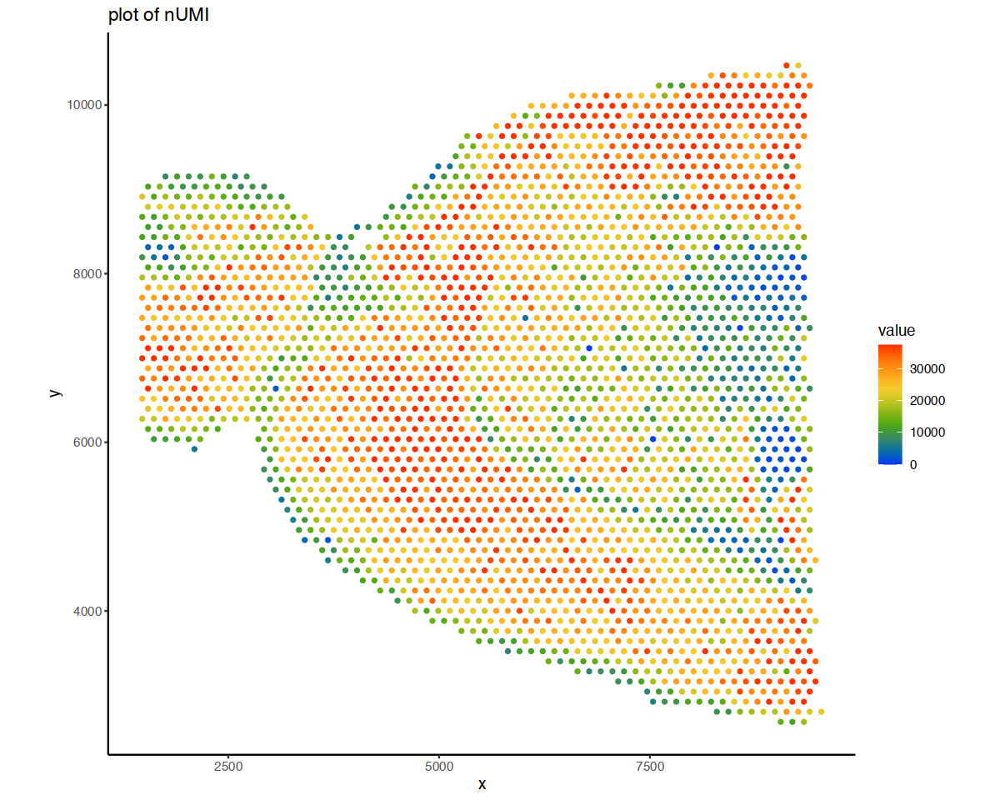

In [50]:
options(repr.plot.width=10, repr.plot.height=8)
plot_puck_continuous(puck=SP, barcodes=names(SP@nUMI), plot_val=SP@nUMI,
                     size=1, ylimit=c(0,round(quantile(SP@nUMI,0.9))),
                     title='plot of nUMI')

In [51]:
unique(Idents(sc_ref))

[1] Ext_L25        Ext_L56        Ext_Thal_1     Ext_L5_1       Ext_Thal_2    
 [6] Ext_L23        Oligo_2        Inh_1          Ext_Hpc_DG2    OPC_1         
[11] Inh_Sst        Ext_L6         Inh_Meis2_2    Unk_1          Inh_3         
[16] Ext_Pir        Inh_4          Ext_Hpc_DG1    Inh_Lamp5      Astro_CTX     
[21] Inh_Meis2_3    Inh_Pvalb      Micro          Oligo_1        Inh_6         
[26] Ext_Amy_2      Astro_THAL_lat Inh_Meis2_1    Astro_AMY_CTX  Ext_L6B       
[31] Ext_L5_2       Ext_Hpc_CA1    Inh_Vip        Astro_THAL_med LowQ_2        
[36] Astro_HYPO     Inh_2          Ext_Hpc_CA3   
38 Levels: Ext_L25 Ext_L56 Ext_Thal_1 Ext_L5_1 Ext_Thal_2 Ext_L23 ... Ext_Hpc_CA3

In [52]:
SC = Reference(counts = sc_ref@assays$RNA@counts, cell_types = sc_ref@active.ident, min_UMI= 50)

In [53]:
myRCTD <- create.RCTD(spatialRNA = SP, reference = SC, max_cores = 2)

Begin: process_cell_type_info

process_cell_type_info: number of cells in reference: 7724

process_cell_type_info: number of genes in reference: 31053




       Ext_L25        Ext_L56     Ext_Thal_1       Ext_L5_1     Ext_Thal_2 
           317            309            256            210            187 
       Ext_L23        Oligo_2          Inh_1    Ext_Hpc_DG2          OPC_1 
           391           1931            357            260            166 
       Inh_Sst         Ext_L6    Inh_Meis2_2          Unk_1          Inh_3 
           124            144            124            189            149 
       Ext_Pir          Inh_4    Ext_Hpc_DG1      Inh_Lamp5      Astro_CTX 
           218            246             85             57            110 
   Inh_Meis2_3      Inh_Pvalb          Micro        Oligo_1          Inh_6 
           167            186            204             87            143 
     Ext_Amy_2 Astro_THAL_lat    Inh_Meis2_1  Astro_AMY_CTX        Ext_L6B 
           137             69             89             76             64 
      Ext_L5_2    Ext_Hpc_CA1        Inh_Vip Astro_THAL_med         LowQ_2 
           

End: process_cell_type_info

create.RCTD: getting regression differentially expressed genes: 

get_de_genes: Ext_L25 found DE genes: 110

get_de_genes: Ext_L56 found DE genes: 109

get_de_genes: Ext_Thal_1 found DE genes: 180

get_de_genes: Ext_L5_1 found DE genes: 67

get_de_genes: Ext_Thal_2 found DE genes: 120

get_de_genes: Ext_L23 found DE genes: 72

get_de_genes: Oligo_2 found DE genes: 349

get_de_genes: Inh_1 found DE genes: 37

get_de_genes: Ext_Hpc_DG2 found DE genes: 147

get_de_genes: OPC_1 found DE genes: 201

get_de_genes: Inh_Sst found DE genes: 90

get_de_genes: Ext_L6 found DE genes: 71

get_de_genes: Inh_Meis2_2 found DE genes: 120

get_de_genes: Unk_1 found DE genes: 61

get_de_genes: Inh_3 found DE genes: 42

get_de_genes: Ext_Pir found DE genes: 48

get_de_genes: Inh_4 found DE genes: 52

get_de_genes: Ext_Hpc_DG1 found DE genes: 159

get_de_genes: Inh_Lamp5 found DE genes: 129

get_de_genes: Astro_CTX found DE genes: 295

get_de_genes: Inh_Meis2_3 found DE genes: 

In [54]:
myRCTD <- run.RCTD(myRCTD, doublet_mode = "doublet")

fitBulk: decomposing bulk



In [55]:
myRCTD <- readRDS('data/results/resultRCTD.rds')

In [56]:
#saveRDS(myRCTD, 'data//result/resultRCTD.rds')
normalized_weights <- normalize_weights(myRCTD@results$weights)

In [57]:
dim(myRCTD@results$weights)

[1] 2696   37

In [59]:
barcodes = colnames(myRCTD@spatialRNA@counts)
cell_type_names = colnames(normalized_weights)

In [60]:
cell_type_names

[1] "Ext_L25"        "Ext_L56"        "Ext_Thal_1"     "Ext_L5_1"      
 [5] "Ext_Thal_2"     "Ext_L23"        "Oligo_2"        "Inh_1"         
 [9] "Ext_Hpc_DG2"    "OPC_1"          "Inh_Sst"        "Ext_L6"        
[13] "Inh_Meis2_2"    "Inh_3"          "Ext_Pir"        "Inh_4"         
[17] "Ext_Hpc_DG1"    "Inh_Lamp5"      "Astro_CTX"      "Inh_Meis2_3"   
[21] "Inh_Pvalb"      "Micro"          "Oligo_1"        "Inh_6"         
[25] "Ext_Amy_2"      "Astro_THAL_lat" "Inh_Meis2_1"    "Astro_AMY_CTX" 
[29] "Ext_L6B"        "Ext_L5_2"       "Ext_Hpc_CA1"    "Inh_Vip"       
[33] "Astro_THAL_med" "LowQ_2"         "Astro_HYPO"     "Inh_2"         
[37] "Ext_Hpc_CA3"

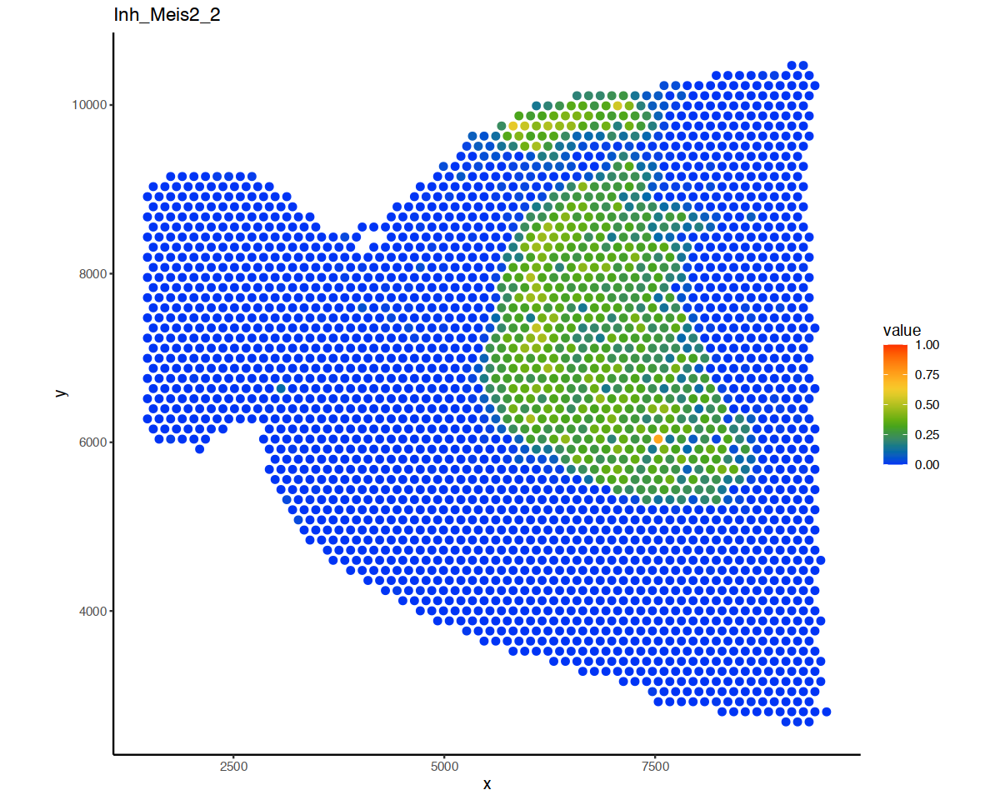

In [66]:
plot_puck_continuous(myRCTD@spatialRNA, barcodes, normalized_weights[,"Inh_Meis2_2"], title ="Inh_Meis2_2", size=2)

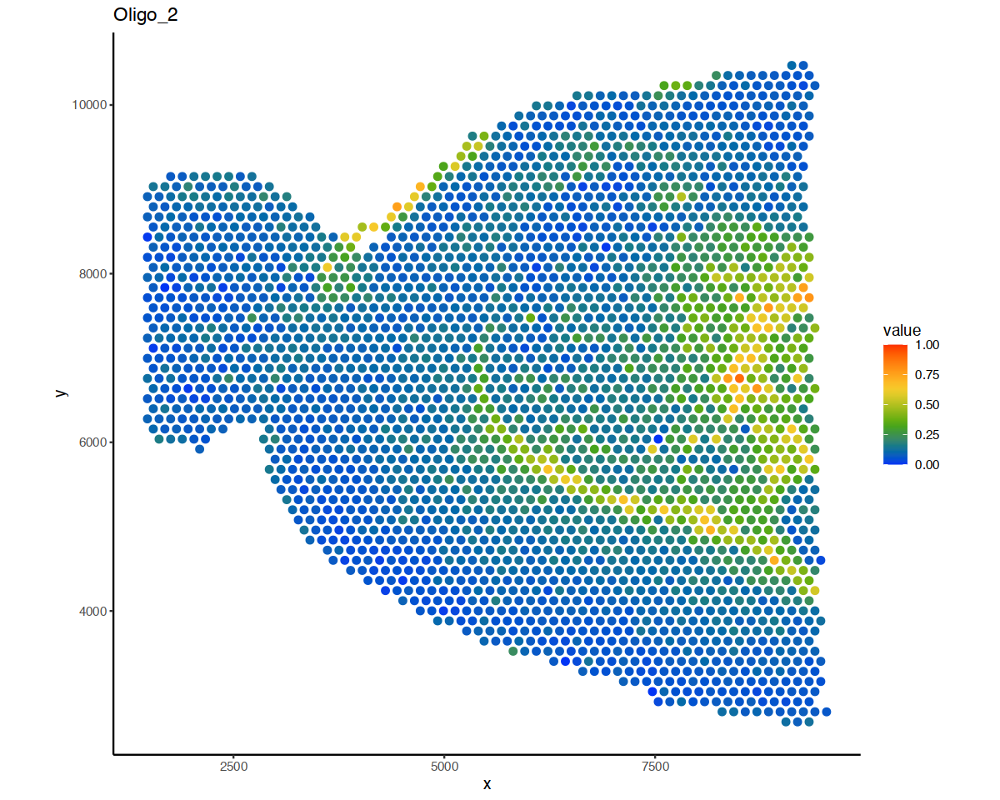

In [111]:
plot_puck_continuous(myRCTD@spatialRNA, barcodes, normalized_weights[,cell_type_names[7]], title =cell_type_names[7], size=2)

In [115]:
cell_type_names[1]

[1] "Ext_L25"

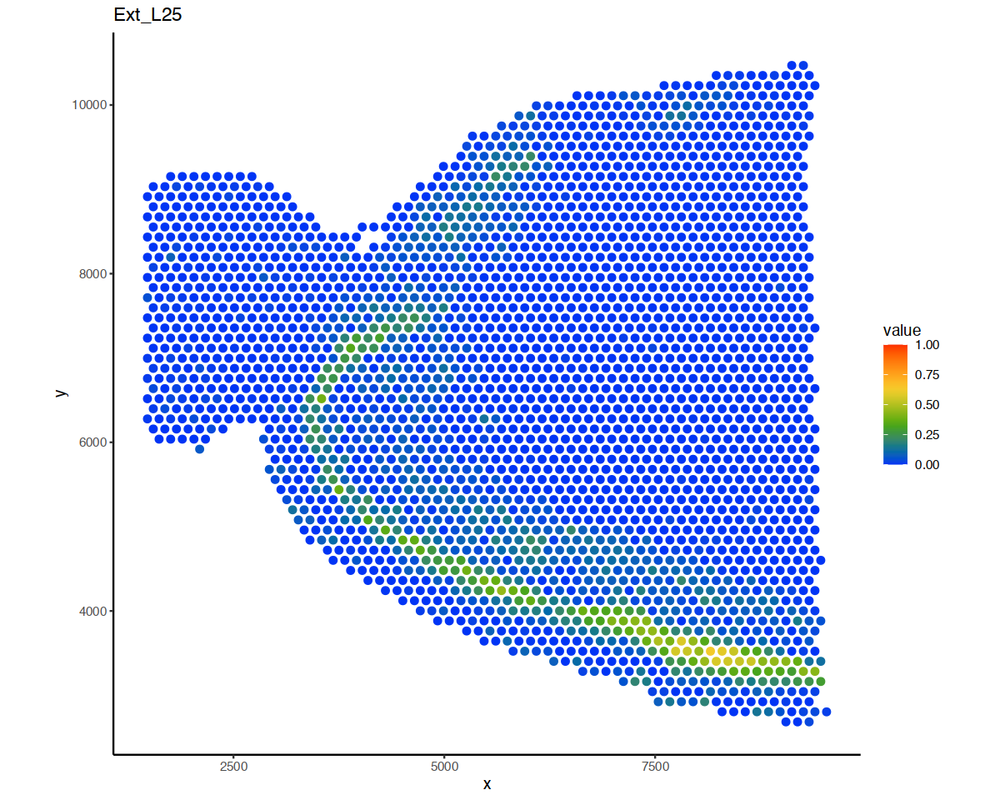

In [113]:
plot_puck_continuous(myRCTD@spatialRNA, barcodes, normalized_weights[,cell_type_names[1]], title =cell_type_names[1], size=2)

In [116]:
dir.create('data/results/RCTD/')

for(i in 1:length(cell_type_names)){
  plot_puck_continuous(myRCTD@spatialRNA, barcodes, normalized_weights[,cell_type_names[i]], title =cell_type_names[i], size=1)
  ggsave(paste0('data/results/RCTD/', cell_type_names[i], '_weights.png'), height=5, width=5, units='in', dpi=300)
}

Warning message in dir.create("data/results/RCTD/"):
“'data/results/RCTD' already exists”


In [69]:
library(STdeconvolve)

In [70]:
anterior1@images$anterior1

Spatial data from the VisiumV1 technology for 2696 samples
Associated assay: Spatial 
Image key: anterior1_ 

In [71]:
m <- as.matrix(normalized_weights)
coords <- anterior1@images$anterior1@coordinates[, c("imagecol","imagerow")]
colnames(coords) <- c('x', 'y')

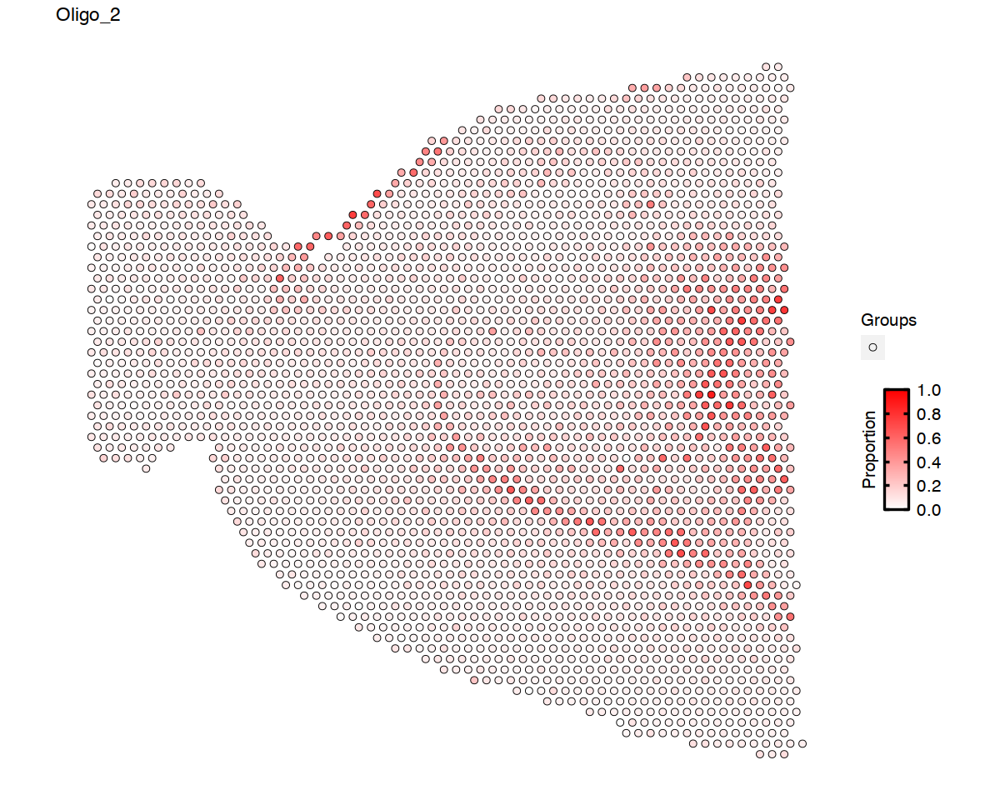

In [72]:
vizTopic(
  theta = m,
  pos = coords,
  topic='Oligo_2',
  groups = NA,
  group_cols = NA,
  size = 2,
  stroke = 0.3,
  alpha = 1,
  low = "white",
  high = "red",
  plotTitle = 'Oligo_2',
  showLegend = TRUE
)

In [73]:
plt <- vizAllTopics(theta = m,
             pos = coords,
             topicOrder=seq(ncol(m)),
             topicCols=rainbow(ncol(m)),
             groups = NA,
             group_cols = NA,
             r = 56,
             lwd = 0.3,
             showLegend = TRUE,
             plotTitle = "scatterpies")

plt <- plt + ggplot2::guides(fill=ggplot2::guide_legend(ncol=2))

Plotting scatterpies for 2696 pixels with 37 cell-types...this could take a while if the dataset is large.




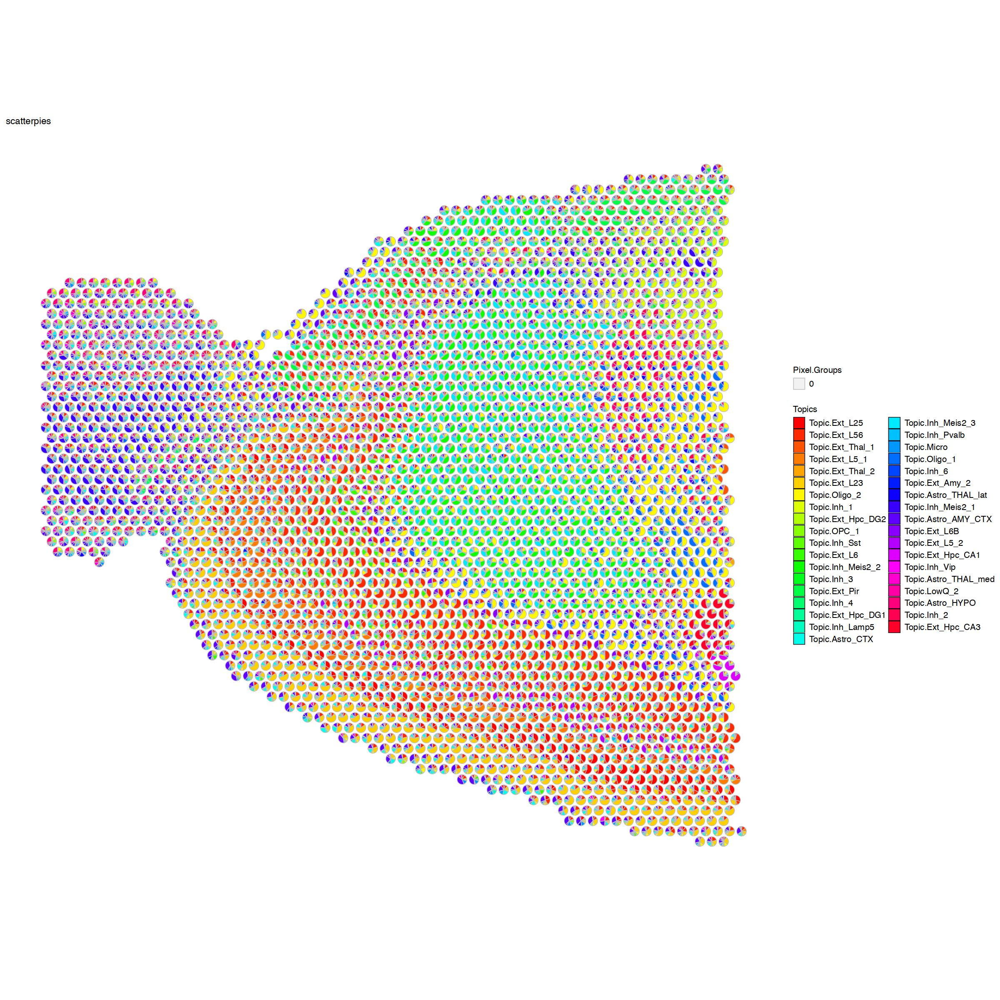

In [74]:
options(repr.plot.width=20, repr.plot.height=20)
plt